# Setting the Environment

In [1]:
import sys
import warnings                                 # `dnd` mode
warnings.filterwarnings('ignore')

In [2]:
# Import necessary libraries

from simple_colors import *                     # print text formatting 
from pprint import pprint                       # import petty print
import numpy as np                              # Import Numpy library for vectors, matrix, algebra
import pandas as pd                             # Import Pandas library for dataframe preparation and manipulation
import statistics                               # Import Statistics library for basic statistics, if required
import statsmodels.api as sm                    # Statsmodel is an essential module to conduct statistical tests
from scipy import stats                         # Scipy builds on Numpy for mathematical computation
from scipy.stats import zscore                  # Import Zscore function from Scipy Stats module
from scipy.stats import variation               # Compute coefficient of variation

import matplotlib.pyplot as plt                 # Import Pyplot from matplotlib
import seaborn as sns                           # Import Seaborn library for data visualization
sns.set(color_codes = True)                     # data visualization

from sklearn.preprocessing import LabelEncoder   # Import library to encode categorical data
from sklearn.preprocessing import StandardScaler # Standard Scaler will be used for scaling the data
from sklearn.neighbors import LocalOutlierFactor # To detect outliers using Local Outlier Factor
from sklearn import model_selection          
from sklearn.model_selection import train_test_split # Importing train test split for splitting data from Scikit Learn
from sklearn.model_selection import GridSearchCV     # Hyperparameter tuning through looping
from sklearn.pipeline import Pipeline                # Assemble multiple steps for crossvalidation
from sklearn import metrics                          # Importing Metrics for Accuracy Testing from Scikit Learn
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix #import the accuracy classes from the library. 
import mglearn                                       # Importing helper package to create figures

from xverse.ensemble import VotingSelector      # Import voting selector for variable selection

import imblearn                                 # Import imbalance learn library to tackle imbalanced datasets
from imblearn.over_sampling import SMOTE        # Importing Synthetic Minority Oversampling Technique for imbalanced class data
from collections import Counter                 # Importing Counter, a dictionary subclass, to count hashable objects

from sklearn.neighbors import KNeighborsClassifier   # Importing KNN Classifier from Scikit Learn         
from sklearn.linear_model import LogisticRegression  # Importing Logistic Regression from Scikit Learn
from sklearn.svm import SVC, NuSVC                   # Support vector machine import
from sklearn.naive_bayes import GaussianNB           # using Gaussian algorithm from Naive Bayes of Scikit Learn
from sklearn.ensemble import RandomForestClassifier  # Import Random Forest Classifier
from xgboost import XGBClassifier                    # Import XG Boost Classifier
from sklearn.ensemble import BaggingClassifier       # Import Bagging Classifier
from sklearn.metrics import accuracy_score
from mlxtend.classifier import StackingCVClassifier  # Import Meta classifier (Stacking)

In [3]:
%matplotlib inline

In [4]:
# Set display of tables

pd.set_option("display.max_column", None) # set display of all columns
pd.options.display.max_colwidth = 150     # increase column width to display large text
pd.set_option("display.max_rows", None) # set display of all rows

# 1. Data Import (Project Q1)

In [5]:
df = pd.read_csv("/Users/kaushik/Desktop/GL_projects/GL_project_data/p3/Data - Parkinsons"); # import Parkinsons data from project folder 

In [6]:
df_dict = pd.read_csv("/Users/kaushik/Desktop/GL_projects/GL_project_data/p3/Data - parkinsons.names", sep='delimiter', header=None);
# import Parkinsons data dictionary from project folder

# 2. Raw Data Examination (Project Q2)

In [7]:
df_dict # Examine the data dictionary

,0
0,Title: Parkinsons Disease Data Set
1,Abstract: Oxford Parkinson's Disease Detection Dataset
2,-----------------------------------------------------
3,Data Set Characteristics: Multivariate
4,Number of Instances: 197
5,Area: Life
6,Attribute Characteristics: Real
7,Number of Attributes: 23
8,Date Donated: 2008-06-26
9,Associated Tasks: Classification


In [8]:
print("The shape of the data is : ", df.shape) # provides the number of rows and columns in the dataframe
print(blue("Interpretation:", ["bold"]), "The shape mentioned above implies that the Parkinsons data has", df.shape[0], "rows or records, and", df.shape[1], "columns or variables."  )

The shape of the data is :  (195, 24)
Interpretation: The shape mentioned above implies that the Parkinsons data has 195 rows or records, and 24 columns or variables.


In [9]:
print(blue("The first five records in the Parkinsons data table appear as under: ", ['bold']))
df.head(5) # print the first five records in the dataframe

The first five records in the Parkinsons data table appear as under: 


,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [10]:
print(blue("The last five records in the Parkinsons data table appear as under: ", ['bold']))
df.tail(5) # print the first five records in the dataframe

The last five records in the Parkinsons data table appear as under: 


,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,0.405,0.02336,0.02498,0.02745,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,0.263,0.01604,0.01657,0.01879,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,0.256,0.01268,0.01365,0.01667,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,0.241,0.01265,0.01321,0.01588,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306
194,phon_R01_S50_6,214.289,260.277,77.973,0.00567,0.00003,0.00295,0.00317,0.00885,0.01884,0.190,0.01026,0.01161,0.01373,0.03078,0.04398,21.209,0,0.462803,0.664357,-5.724056,0.190667,2.555477,0.148569


In [11]:
print(blue("A concise summary of Dataframe and its columns ––", ['bold']))
print(df.info())# To check the dataframe summary include datatype of each column, non-null value count, and memory usage

A concise summary of Dataframe and its columns ––
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64

## Comments on Raw Data





**Overall Interpretation:** 
Number of records: There are 195 records in the dataframe.
Structure of the file: The data is in wide format. There are 195 rows and 24 columns in the dataframe. Each column has 195 non-null records.
Number of attributes: There are 24 attributes in the dataframe.
Types of attributes: The first column represents the ASCII coded identifier of records and is in object/ string format. Of the remaining columns, 22 attributes are in float format. The dependent variable (health status) is a binary variable, in which the two health outcomes are labelled as 0 and 1.
Potential Challenges and Solution: 1) All the independent variables are numerical and in float format. Their range and spread can be different. Scaling would be needed, especially for techniques like KNN, which are very sensitive. 2) As the data are "real" records from patients, with multiple attributes of sound (e.g. frequency, shimmer, etc.), each repsented by closely related variables (e.g. for vocal fundamental frq. average, min and max), there can be multiple correlation among features, i.e., many independent variables can be strongly correlated. I need to find individual correlation and which features are important. 3) As their are >20 independent variables, the model can become complex, the training cost can go high, and the risk of overfitting can also increase. So, feature selection will be needed. 4) The first column, representing the identifiers (ASCII coded), should be dropped from the analytical dataframe. 

# 3. Univariate & bivariate analysis (Project Q3)

##    3.1. Preparing the Analytical Dataframe

In [12]:
df = df.drop(labels = "name", axis = 1) # The name column has nothing to do with the model attriibutes. 
                                        # So I dropped it.

In [13]:
# Checking for a duplicate record
duplicate = df[df.duplicated()] # Selecting duplicate rows except first with occurrence based on all columns
print(blue("There are", ["bold"]), duplicate.shape[0], 
      blue("duplicate rows or records in the Parkinsons data.", ["bold"]))

There are 0 duplicate rows or records in the Parkinsons data.


## 3.2. Checking the 5-point summary of the numerical attributes

In [14]:
print(blue("The description of the different attributes is given below :", ["bold"]))
df.describe() #describing the entire dataframe

The description of the different attributes is given below :


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,0.015664,0.017878,0.024081,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,0.010153,0.012024,0.016947,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,0.004550,0.005700,0.007190,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,0.008245,0.009580,0.013080,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,0.012790,0.013470,0.018260,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,0.020265,0.022380,0.029400,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,0.056470,0.079400,0.137780,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [15]:
indep_var = df.drop(labels = "status", axis = 1) # creating a subset dataframe with only independent attributes

In [16]:
print(blue("Coefficient of Variation of the independent attributes are ––", ["bold"]))
for (columnName, columnData) in indep_var.iteritems(): 
    print(columnName, ":", round(variation(columnData.values), 2)) 


Coefficient of Variation of the independent attributes are ––
MDVP:Fo(Hz) : 0.27
MDVP:Fhi(Hz) : 0.46
MDVP:Flo(Hz) : 0.37
MDVP:Jitter(%) : 0.78
MDVP:Jitter(Abs) : 0.79
MDVP:RAP : 0.9
MDVP:PPQ : 0.8
Jitter:DDP : 0.9
MDVP:Shimmer : 0.63
MDVP:Shimmer(dB) : 0.69
Shimmer:APQ3 : 0.65
Shimmer:APQ5 : 0.67
MDVP:APQ : 0.7
Shimmer:DDA : 0.65
NHR : 1.62
HNR : 0.2
RPDE : 0.21
DFA : 0.08
spread1 : -0.19
spread2 : 0.37
D2 : 0.16
PPE : 0.44


**Interpretation:**

* The three variables representing the **vocal fundamental frequency** (average, maximum, and minimum) have mean>median, indicating the chance of positively skewed distribution.
* The **max vocal fundamental frequency** have much higher coefficient of variation than the average and minimum, suggesting a more dispersed distribution.
* For the **other measures of MDVP**, i.e., Jitter(%), Jitter(Abs), RAP, PPQ, and DDP, as well as MDVP Shimmer and variation in amplitude measures, the dispersion is even higher and the distribution is expected to be positively skewed (from mean>median).
* Of the measures indicating **noise to tonal components**, NHR is expected to be heavility positive skewed (Mean is almost two times of median) and highly dispersed (CoV=1.62).
* The **non-linear measures** of fundamental frequency are having means near to medians. Depending on the modality, these attributes can have a normal distrbution.
* The **range of the independent attributes** are highly different and therefore, scaling would be essential for this data.

## 3.3. Checking the distribution of independent variables

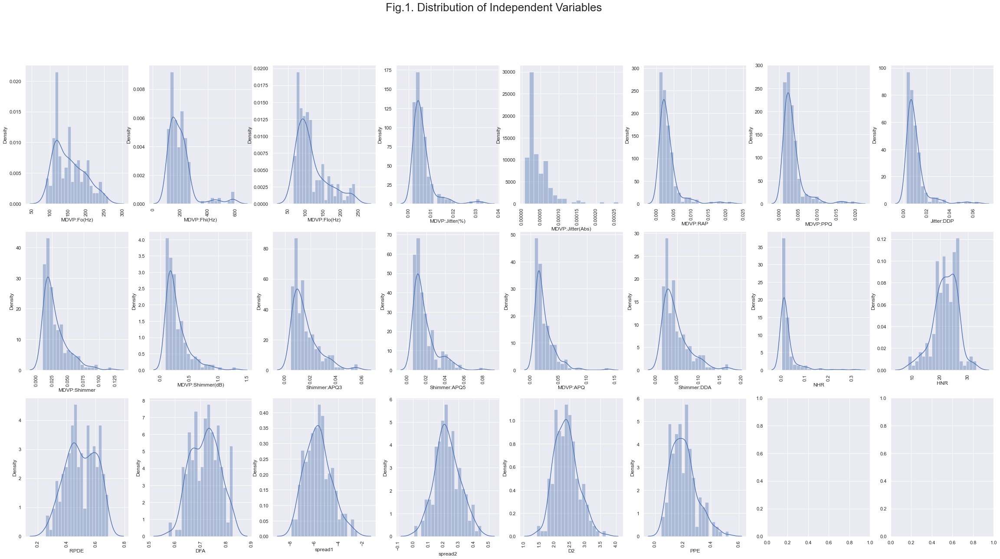

In [17]:
col = indep_var.columns.to_list()                # creating a list of columns present in the subset 

# Plotting the distribution of each independent column in the dataframe
fig, ax = plt.subplots(3, 8, figsize=(40, 20))
fig.suptitle('Fig.1. Distribution of Independent Variables', fontsize=26)
sns.set_style("whitegrid")
for variable, subplot in zip(col, ax.flatten()):
    sns.distplot(df[variable], bins = 20, ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90) 

**Comments on Distribution:**

As indicated from the 5-point summary and descriptive assessment above, the vocal fundamental frequency attributes, shimmer and variations in fundamental frequency, NHR of noise to total components ratio, and PPE are positively skewed distributions. Most of the independent variable have unimodal distribution. Bimodal and notched distributions can be seen for RPDE and DFA respectively. MDVP jitter, RAP, PPQ, APQ have a platykurtic distribution, indicating fewer extreme values. 

In [18]:
print(blue("The skewness of the variables are :\n", ["bold"]))
skewness = df.skew(axis = 0).to_frame("Skewness")
skewness.style.applymap(lambda x: 'background-color : red' if x>3 else ('background-color : orange' if x>1 else ''))

The skewness of the variables are :



,Skewness
MDVP:Fo(Hz),0.591737
MDVP:Fhi(Hz),2.542146
MDVP:Flo(Hz),1.217350
MDVP:Jitter(%),3.084946
MDVP:Jitter(Abs),2.649071
MDVP:RAP,3.360708
MDVP:PPQ,3.073892
Jitter:DDP,3.362058
MDVP:Shimmer,1.666480
MDVP:Shimmer(dB),1.999389


**Interpretation:**

Among the independent variables, the skewness of MDVP, shimmer and NHR are > +1, and therefore the distribution is right-skewed. Of these MDVP jitter, RAP, PPQ, DDP, and NHR have very high right skewness (>3).

In [19]:
print(blue("The Kurtosis of the variables are :\n", ["bold"]))
Kurtosis = df.kurt(axis = 0).to_frame("Kurtosis")
Kurtosis.style.applymap(lambda x: 'background-color : red' if x>10 or x<-10 else ('background-color : orange' if x>7 or x<-7 else ''))

The Kurtosis of the variables are :



,Kurtosis
MDVP:Fo(Hz),-0.627898
MDVP:Fhi(Hz),7.627241
MDVP:Flo(Hz),0.654615
MDVP:Jitter(%),12.030939
MDVP:Jitter(Abs),10.869043
MDVP:RAP,14.213798
MDVP:PPQ,11.963922
Jitter:DDP,14.224762
MDVP:Shimmer,3.238308
MDVP:Shimmer(dB),5.128193


**Interpretation:**
    
Max MDVP, jitter, MDVP RAP, PPQ, MDVP APQ, and NHR have kortosis >7. Of these distributions, Jitter, RAP, PPQ, DDP, APQ, NHR have high kurtosis >10.

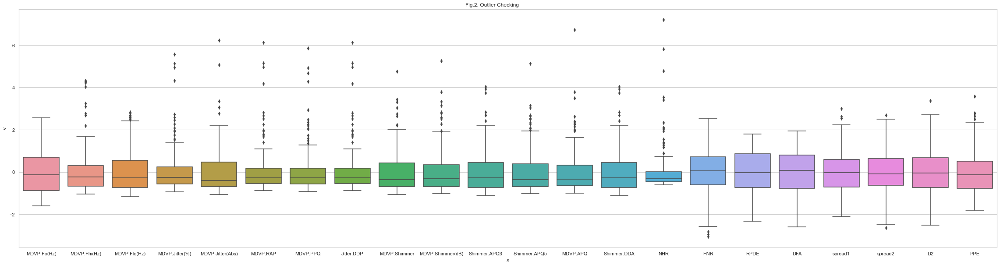

In [20]:
indep_var_Scaled  = indep_var.apply(zscore)                         # convert all attributes to Z scale 
df_long = pd.melt(indep_var_Scaled, var_name="x", value_name="v")   # Create a long dataframe 

# plot the boxplots of all independent variables together
plt.figure(figsize=(40,10))
sns.set_style("whitegrid")
g=sns.boxplot(x="x", y="v", data=df_long)
plt.suptitle("Fig.2. Outlier Checking", y=0.9);

**Interpretation:**

An outlier detection on the z-score of the attributes reflected that 19 out of 23 variables have outliers. These outliers are pesent at the upper range, except for HNR. The higher number of outliers are commensurate with the finding of dispersion for columns above.

## 3.4. Checking the bivariate relationship of independent variables 

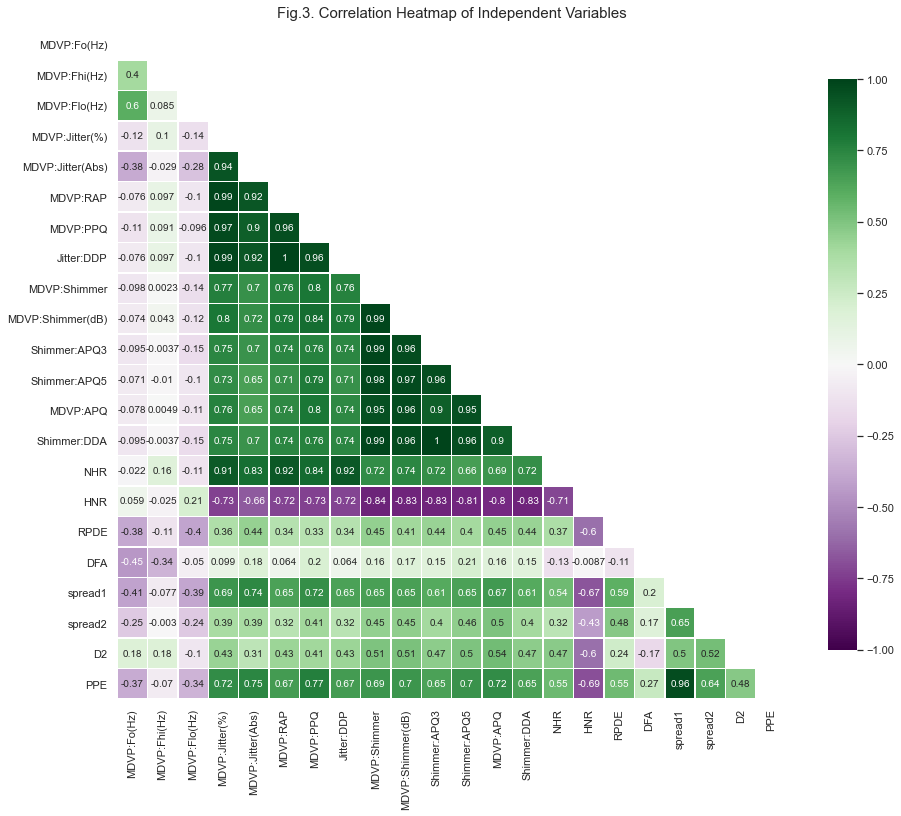

In [21]:
# Creating the correlation matrix 
corr = indep_var.corr() 

# Draw the heatmap with the correlation matrix
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(30, 10, as_cmap=True) # Generate a custom diverging colormap
mask = np.triu(np.ones_like(corr, dtype=bool))
corplot = sns.heatmap(corr, mask=mask, cmap='PRGn', vmin=-1, vmax=1, center=0,
            square=True, annot = True, linewidths=.5, cbar_kws={"shrink": .7})
corplot.set_title('Fig.3. Correlation Heatmap of Independent Variables', fontdict={'fontsize':15}, pad=12);

**Interpretation:** 
    
As expected from the dataframe details, the correlation heatmap shows strong correlations among multiple variables. An ordered list is computed below.

In [22]:
print(blue("The pairplot correlations in descending order–", ["bold"]))
corr.abs().where(np.triu(np.ones(corr.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False)

The pairplot correlations in descending order–


Shimmer:APQ3      Shimmer:DDA         1.000000
MDVP:RAP          Jitter:DDP          1.000000
MDVP:Jitter(%)    Jitter:DDP          0.990276
                  MDVP:RAP            0.990276
MDVP:Shimmer      Shimmer:DDA         0.987626
                  Shimmer:APQ3        0.987625
                  MDVP:Shimmer(dB)    0.987258
                  Shimmer:APQ5        0.982835
MDVP:Jitter(%)    MDVP:PPQ            0.974256
MDVP:Shimmer(dB)  Shimmer:APQ5        0.973751
                  Shimmer:DDA         0.963202
                  Shimmer:APQ3        0.963198
spread1           PPE                 0.962435
MDVP:Shimmer(dB)  MDVP:APQ            0.960977
Shimmer:APQ5      Shimmer:DDA         0.960072
Shimmer:APQ3      Shimmer:APQ5        0.960070
MDVP:PPQ          Jitter:DDP          0.957319
MDVP:RAP          MDVP:PPQ            0.957317
MDVP:Shimmer      MDVP:APQ            0.950083
Shimmer:APQ5      MDVP:APQ            0.949146
MDVP:Jitter(%)    MDVP:Jitter(Abs)    0.935714
MDVP:Jitter(A

## 3.5. Distribution of Dependent Variable

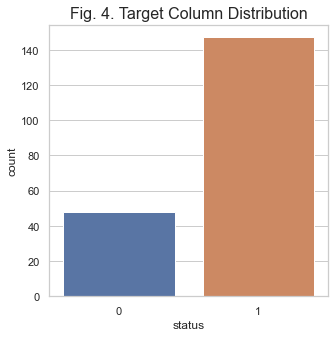

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.set_style("white")
sns.countplot(df["status"])
plt.title("Fig. 4. Target Column Distribution", fontsize=16);

There is class imbalance in the target variable. Healthy subjects (coded as 1) are present in much higher number than the PD patients.

# 3.6 Examining bivariate relationships based on dependent variable class

In [24]:
sns.set_style("whitegrid")
g = sns.pairplot(df,hue= "status", size=5)
g.fig.suptitle("Fig.5. Distribution of Attributes, and Health Status wise Pairplots", fontsize = 50, y=1);

High-level Insights from Pairplot:
* The distributions of each independent variable for the two classes of the target are different, indicating influence of each of the independent variables on the target.  
* Scatters are almost diagonally distributed, indicating very correlation for multiple independent variables, e.g., spread1 vs PPE. This is obvious given the high correlation detected above from the correlation matrix.

## 3.7. Recommendation from Data Examination and Univariate & Bivariate Relationships

### Setting Analysis Strategy

* Multiple features are positively skewed. Transformations like the BoxCox Transformations may affect the overall distributions of feature and the predictions. Generally in classification problem this doesn't pose a problem unless their is class imbalance.
* Outliers exist for multiple column attributes. I will identify the outlier records through local outlier factors. First classification prediction will be run without removing the outliers. Then they will be run again after removing the outliers.
* Class imbalance exists for the target variable. I will use Synthetic Minority Oversampling Technique (SMOTE) to address the class imbalance.
* A large number of features are highly correlated. I will use voting technique to select the features. I will run predictions once by including all the features, and then by removing the features based on voting.

# 4. Split the dataset into training and test set in the ratio of 70:30 (Project Q4)

## 4.1. Finding outliers

In [25]:
# Setting up the data. 
# K is fixed by passing the n_neighbors parameter with integer. 
# I have used the default Euclidean distance.
lof = LocalOutlierFactor(n_neighbors = 20)
#Training the model taking only independent variables
df['lof'] = lof.fit_predict(df[col])
#Getting the negative LOF score
df['negative_outlier_factor'] = lof.negative_outlier_factor_

In [26]:
# Detecting the outliers
outliers = df[df['lof'] == -1]

In [27]:
# Finding the number of outlier records
n_outliers = outliers.shape[0]
n_records = df.shape[0]
percent_outliers = n_outliers/n_records*100
print(blue("There are", ["bold"]), round(percent_outliers, 2), 
      blue("percent outlier records in the Parkinsons data.", ["bold"]))

There are 8.72 percent outlier records in the Parkinsons data.


In [28]:
# Droping the outlier records to create a new dataframe df1
df1 = df.loc[df['lof'] >= 0]

## 4.2. Creating two separate dataframes– one with outlier and the other without outliers

In [29]:
# Removing the lof and negative outlier factor columns
df = df.drop(labels= "lof" , axis = 1)
df = df.drop(labels= "negative_outlier_factor" , axis = 1)
df1 = df1.drop(labels= "lof" , axis = 1)
df1 = df1.drop(labels= "negative_outlier_factor" , axis = 1)

In [30]:
print("The dataframe with outlier has", df.shape[0], "records.")
print("The dataframe without outlier has", df1.shape[0], "records.")

The dataframe with outlier has 195 records.
The dataframe without outlier has 178 records.


In [31]:
print(blue("Column wise number of missing values in the original dataframe:", ["bold"]))
print(df.isnull().sum())


print(blue("Column wise number of missing values in the outlier removed dataframe:", ["bold"]))
print(df.isnull().sum())

Column wise number of missing values in the original dataframe:
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64
Column wise number of missing values in the outlier removed dataframe:
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR             

## 4.3. Target and Feature separation and Train-test split

In [32]:
# Target and feature separation in original dataframe
X = df.drop(labels= "status" , axis = 1) 
y = df["status"]
# Target and feature separation in outlier removed dataframe
X1 = df1.drop(labels= "status" , axis = 1) 
y1 = df1["status"]

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.30, random_state=1)

# 5. Prepare the data for training (Project Q5)

## 5.1. Scaling

In [34]:
# Scaling the data with standard scaler
scaler = StandardScaler()                 # defining scaler
X_train = scaler.fit_transform(X_train)   # scale the training data
X_test = scaler.fit_transform(X_test)     # scale the testing data
X1_train = scaler.fit_transform(X1_train) # scale the training data
X1_test = scaler.fit_transform(X1_test)   # scale the testing data

In [35]:
print(blue("The frequency of classess of the label variable in the training data originally was:", ["bold"]), Counter(y_train))
print(blue("The frequency of classess of the label variable in the training data after outlier removal was:", ["bold"]), Counter(y1_train))

The frequency of classess of the label variable in the training data originally was: Counter({1: 107, 0: 29})
The frequency of classess of the label variable in the training data after outlier removal was: Counter({1: 97, 0: 27})


## 5.2 SMOTE

In [36]:
oversample = SMOTE()
X_train, y_train = oversample.fit_resample(X_train, y_train)
new_counter = Counter(y_train)
print("The frequency of classess of the label variable after SMOTE in the training data in original dataframe:", new_counter)
X1_train, y1_train = oversample.fit_resample(X1_train, y1_train)
new_counter1 = Counter(y1_train)
print("The frequency of classess of the label variable after SMOTE in the training data in outlier removed dataframe:", new_counter1)

The frequency of classess of the label variable after SMOTE in the training data in original dataframe: Counter({0: 107, 1: 107})
The frequency of classess of the label variable after SMOTE in the training data in outlier removed dataframe: Counter({1: 97, 0: 97})


# 6. Train Classification Algorithm (Project Q6)

## 6.1. Initialize Classifiers

In [37]:
# Initializing KNN Classifier
clf_1 = KNeighborsClassifier(n_neighbors=10)

# Initializing Naive Bayes
clf_2 = GaussianNB()

# Initializing Logistic Regression
clf_3 = LogisticRegression(solver="liblinear")


## 6.2. Assessment with all features without removing outliers 

### 6.2.1. KNN Classifier

In [38]:
clf_1.fit(X_train, y_train)
knn_pred = clf_1.predict(X_test)
print("Training set score KNN Model: {:.2f}".format(clf_1.score(X_train, y_train)))
print("Validation set score KNN Model: {:.2f}".format(clf_1.score(X_test, y_test)))

Training set score KNN Model: 0.93
Validation set score KNN Model: 0.90


### 6.2.2. Naive Bayes Classifier

In [39]:
clf_2.fit(X_train, y_train)
gnb_pred = clf_2.predict(X_test)
print("Training set score GNB Model: {:.2f}".format(clf_2.score(X_train, y_train)))
print("Validation set score GNB Model: {:.2f}".format(clf_2.score(X_test, y_test)))

Training set score GNB Model: 0.80
Validation set score GNB Model: 0.68


### 6.2.3. Logistic Regression Classifier

In [40]:
clf_3.fit(X_train, y_train)
lr_pred = clf_3.predict(X_test)
print("Training set score LR Model: {:.2f}".format(clf_3.score(X_train, y_train)))
print("Validation set score LR Model: {:.2f}".format(clf_3.score(X_test, y_test)))

Training set score LR Model: 0.88
Validation set score LR Model: 0.80


## 6.3. Assessment after removing outliers

### 6.3.1. KNN Classifier

In [41]:
clf_1.fit(X1_train, y1_train)
knn_pred_1 = clf_1.predict(X1_test)
print("Training set score KNN Model: {:.2f}".format(clf_1.score(X1_train, y1_train)))
print("Validation set score KNN Model: {:.2f}".format(clf_1.score(X1_test, y1_test)))

Training set score KNN Model: 0.91
Validation set score KNN Model: 0.83


### 6.3.2. Naive Bayes Classifier

In [42]:
clf_2.fit(X1_train, y1_train)
gnb_pred_1 = clf_2.predict(X1_test)
print("Training set score GNB Model: {:.2f}".format(clf_2.score(X1_train, y1_train)))
print("Validation set score GNB Model: {:.2f}".format(clf_2.score(X1_test, y1_test)))

Training set score GNB Model: 0.79
Validation set score GNB Model: 0.72


### 6.3.3. Logistic Regression Classifier

In [43]:
clf_3.fit(X1_train, y1_train)
lr_pred_1 = clf_3.predict(X1_test)
print("Training set score LR Model: {:.2f}".format(clf_3.score(X1_train, y1_train)))
print("Validation set score LR Model: {:.2f}".format(clf_3.score(X1_test, y1_test)))

Training set score LR Model: 0.87
Validation set score LR Model: 0.70


# 7. Train A Meta-Classifier

## 7.1. Meta-classifier training on original data

In [44]:
clf_meta = SVC(C = 50, degree = 1, gamma = "auto", kernel = "rbf", probability = True)

stack_clf = StackingCVClassifier(classifiers = [clf_1, clf_2, clf_3],
                                 shuffle = False,
                                 use_probas = False, # taking actual classes and not probabilities
                                 meta_classifier = clf_meta, #met-classifier is a support vector classifier
                                 random_state=42)

#### 7.1.1. Cross-validation applied over training set only to show comparative accuracy

In [45]:
print(blue('5-fold cv on training set only:\n'))

for clf, label in zip([clf_1, clf_2, clf_3, stack_clf], 
                      ['KNN', 
                       'Naive Bayes',
                       'Logistic Regression',
                       'MetaClassifier']):

    accuracy = model_selection.cross_val_score(clf, 
                                             X_train, y_train, 
                                             cv=5, 
                                             scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" 
          % (accuracy.mean(), accuracy.std(), label))

5-fold cv on training set only:

Accuracy: 0.88 (+/- 0.04) [KNN]
Accuracy: 0.80 (+/- 0.04) [Naive Bayes]
Accuracy: 0.86 (+/- 0.05) [Logistic Regression]
Accuracy: 0.85 (+/- 0.06) [MetaClassifier]


#### 7.1.2. Cross-validation applied to entire data to show comparative accuracy

In [46]:
print(blue('5-fold cv on entire data set:\n'))

for clf, label in zip([clf_1, clf_2, clf_3, stack_clf], 
                      ['KNN', 
                       'Naive Bayes',
                       'Logistic Regression',
                       'MetaClassifier']):

    accuracy = model_selection.cross_val_score(clf, 
                                             X, y, 
                                             cv=5, 
                                             scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" 
          % (accuracy.mean(), accuracy.std(), label))

5-fold cv on entire data set:

Accuracy: 0.75 (+/- 0.07) [KNN]
Accuracy: 0.70 (+/- 0.08) [Naive Bayes]
Accuracy: 0.81 (+/- 0.08) [Logistic Regression]
Accuracy: 0.77 (+/- 0.10) [MetaClassifier]


#### 7.1.3. Final Training of meta-classifier on training set and checking accuracy on testing set

In [47]:
stack_clf.fit(X_train, y_train)
stack_pred = stack_clf.predict(X_test)
print("Training set score Meta Model: {:.2f}".format(stack_clf.score(X_train, y_train)))
print("Validation set score Meta Model: {:.2f}".format(stack_clf.score(X_test, y_test)))

Training set score Meta Model: 0.94
Validation set score Meta Model: 0.86


## 7.2. Meta-classifier training on outlier removed data

In [48]:
stack_clf.fit(X1_train, y1_train)
stack_pred_1 = stack_clf.predict(X1_test)
print("Training set score Meta Model: {:.2f}".format(stack_clf.score(X1_train, y1_train)))
print("Validation set score Meta Model: {:.2f}".format(stack_clf.score(X1_test, y1_test)))

Training set score Meta Model: 0.92
Validation set score Meta Model: 0.83


# 8. Train a Standard Ensemble Model

## 8.1. Train A Random Forest without removing outliers

In [49]:
rf_clf = RandomForestClassifier(n_estimators = 50, random_state=1,max_features=10)
rf_clf = rf_clf.fit(X_train, y_train)

In [50]:
y_predict = rf_clf.predict(X_test)

print("Training set score RF Model: {:.2f}".format(rf_clf.score(X_train, y_train)))
print("Validation set score RF Model: {:.2f}".format(rf_clf.score(X_test, y_test)))

Training set score RF Model: 1.00
Validation set score RF Model: 0.83


## 8.2. Train after removing outliers

In [51]:
rf_clf = RandomForestClassifier(n_estimators = 50, random_state=1,max_features=10)
rf_clf = rf_clf.fit(X1_train, y1_train)

In [52]:
y_predict1 = rf_clf.predict(X1_test)

print("Training set score RF Model: {:.2f}".format(rf_clf.score(X1_train, y1_train)))
print("Validation set score RF Model: {:.2f}".format(rf_clf.score(X1_test, y1_test)))

Training set score RF Model: 1.00
Validation set score RF Model: 0.85


# 9. Repeating 6,7,8 after Feature Selection

## 9.1. Select feature using XVERSE Voting Selector

In [53]:
clf = VotingSelector()
clf.fit(X1, y1)
clf.feature_importances_

,Variable_Name,Information_Value,Random_Forest,Recursive_Feature_Elimination,Extra_Trees,Chi_Square,L_One
0,PPE,2.109562,0.158880,0.162768,0.085835,5.225590,0.000000
1,spread1,2.109562,0.130829,1.998473,0.092838,5.447895,0.000000
2,MDVP:Fhi(Hz),1.752061,0.073033,0.000000,0.081701,3.199214,0.008884
3,MDVP:APQ,1.725664,0.030555,0.061050,0.043130,3.212426,0.000000
4,MDVP:Shimmer,1.549248,0.030388,0.058170,0.031002,3.910882,0.000000
5,Shimmer:DDA,1.508807,0.024215,0.076271,0.036359,3.822584,0.000000
6,Shimmer:APQ5,1.508807,0.050232,0.000000,0.027763,3.635238,0.000000
7,Shimmer:APQ3,1.508807,0.031559,0.000000,0.031440,3.824706,0.000000
8,MDVP:Shimmer(dB),1.502697,0.020220,0.527568,0.020752,3.456460,0.000000
9,MDVP:RAP,1.501849,0.032503,0.000000,0.032269,1.961264,0.000000


In [54]:
clf.feature_votes_

,Variable_Name,Information_Value,Random_Forest,Recursive_Feature_Elimination,Extra_Trees,Chi_Square,L_One,Votes
0,PPE,1,1,1,1,1,1,6
1,spread1,1,1,1,1,1,1,6
2,MDVP:Fhi(Hz),1,1,0,1,1,1,5
3,MDVP:APQ,1,0,1,1,1,1,5
5,Shimmer:DDA,1,0,1,1,1,1,5
19,D2,0,1,1,1,0,1,4
12,MDVP:Fo(Hz),0,1,0,1,1,1,4
21,MDVP:Flo(Hz),0,1,0,1,1,1,4
6,Shimmer:APQ5,1,1,0,0,1,1,4
4,MDVP:Shimmer,1,0,1,0,1,1,4


In [55]:
clf.transform(X1).head()

,PPE,spread1,MDVP:Fhi(Hz),MDVP:APQ,Shimmer:DDA,D2,MDVP:Fo(Hz),MDVP:Flo(Hz),Shimmer:APQ5,MDVP:Shimmer,MDVP:Shimmer(dB),spread2,MDVP:RAP,Shimmer:APQ3,MDVP:Jitter(Abs),NHR,RPDE,Jitter:DDP,HNR,DFA,MDVP:Jitter(%),MDVP:PPQ
0,0.284654,-4.813031,157.302,0.02971,0.06545,2.301442,119.992,74.997,0.03130,0.04374,0.426,0.266482,0.00370,0.02182,0.00007,0.02211,0.414783,0.01109,21.033,0.815285,0.00784,0.00554
1,0.368674,-4.075192,148.650,0.04368,0.09403,2.486855,122.400,113.819,0.04518,0.06134,0.626,0.335590,0.00465,0.03134,0.00008,0.01929,0.458359,0.01394,19.085,0.819521,0.00968,0.00696
2,0.332634,-4.443179,131.111,0.03590,0.08270,2.342259,116.682,111.555,0.03858,0.05233,0.482,0.311173,0.00544,0.02757,0.00009,0.01309,0.429895,0.01633,20.651,0.825288,0.01050,0.00781
3,0.368975,-4.117501,137.871,0.03772,0.08771,2.405554,116.676,111.366,0.04005,0.05492,0.517,0.334147,0.00502,0.02924,0.00009,0.01353,0.434969,0.01505,20.644,0.819235,0.00997,0.00698
4,0.410335,-3.747787,141.781,0.04465,0.10470,2.332180,116.014,110.655,0.04825,0.06425,0.584,0.234513,0.00655,0.03490,0.00011,0.01767,0.417356,0.01966,19.649,0.823484,0.01284,0.00908


In [56]:
feature_select = clf.feature_votes_
selected_features = feature_select[feature_select["Votes"]>=4].Variable_Name.unique()

## 9.2. Retain only selected features in feature dataframe

In [57]:
X1 = X1[selected_features]

## 9.3. Training the new dataframe

In [58]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X1, y1, test_size=0.30, random_state=42)

## 9.4. Data preparation (Scaling and SMOTE)

In [59]:
# Scaling the data with standard scaler
scaler = StandardScaler()
X2_train = scaler.fit_transform(X2_train) # scale the training data
X2_test = scaler.fit_transform(X2_test)   # scale the testing data

In [60]:
print("The frequency of classess of the label variable in the training data originally was:", Counter(y2_train))

The frequency of classess of the label variable in the training data originally was: Counter({1: 94, 0: 30})


In [61]:
oversample = SMOTE()
X2_train, y2_train = oversample.fit_resample(X2_train, y2_train)
new_counter = Counter(y2_train)
print("The frequency of classess of the label variable in the training data originally was:", new_counter)

The frequency of classess of the label variable in the training data originally was: Counter({1: 94, 0: 94})


## 9.5. Train Classification Algorithm

### Initialize Classifiers

In [62]:
# Initializing KNN Classifier
clf_1 = KNeighborsClassifier(n_neighbors=10)

# Initializing Naive Bayes
clf_2 = GaussianNB()

# Initializing Logistic Regression
clf_3 = LogisticRegression(solver="liblinear")

### KNN Classification

In [63]:
clf_1.fit(X2_train, y2_train)
knn_pred = clf_1.predict(X2_test)

In [64]:
print("Training set score KNN Model: {:.2f}".format(clf_1.score(X2_train, y2_train)))
print("Validation set score KNN Model: {:.2f}".format(clf_1.score(X2_test, y2_test)))

Training set score KNN Model: 0.91
Validation set score KNN Model: 0.78


### Naive Bayes Classifiaction

In [65]:
clf_2.fit(X2_train, y2_train)
gnb_pred = clf_2.predict(X2_test)

In [66]:
print("Training set score GNB Model: {:.2f}".format(clf_2.score(X2_train, y2_train)))
print("Validation set score GNB Model: {:.2f}".format(clf_2.score(X2_test, y2_test)))

Training set score GNB Model: 0.84
Validation set score GNB Model: 0.70


### Logistic Regression Classifiaction

In [67]:
clf_3.fit(X2_train, y2_train)
lr_pred = clf_3.predict(X2_test)

In [68]:
print("Training set score LR Model: {:.2f}".format(clf_3.score(X2_train, y2_train)))
print("Validation set score LR Model: {:.2f}".format(clf_3.score(X2_test, y2_test)))

Training set score LR Model: 0.88
Validation set score LR Model: 0.80


## 9.6 Meta-Classifier Training and Accuracy Testing

In [69]:
clf_meta = SVC(C = 50, degree = 1, gamma = "auto", kernel = "rbf", probability = True) 

stack_clf = StackingCVClassifier(classifiers = [clf_1, clf_2, clf_3],
                                 shuffle = False,
                                 use_probas = True,
                                 meta_classifier = clf_meta,
                                 random_state=42)

In [70]:
stack_clf.fit(X2_train, y2_train)
stack_pred_1 = stack_clf.predict(X2_test)
print("Training set score Meta Model: {:.2f}".format(stack_clf.score(X2_train, y2_train)))
print("Validation set score Meta Model: {:.2f}".format(stack_clf.score(X2_test, y2_test)))

Training set score Meta Model: 0.96
Validation set score Meta Model: 0.87


## 9.7. Crude (without hyperparameter tuning) comparison of different ensemble Models

In [71]:
ensemble_models=[RandomForestClassifier(), BaggingClassifier(), XGBClassifier()]
model_names=['RandomForestClassifier','Bagging', 'XGBoost']
accuracy=[]
accuracy_dict={}
for model in range(len(ensemble_models)):
    clf=ensemble_models[model]
    clf.fit(X2_train,y2_train)
    pred=clf.predict(X2_test)
    accuracy.append(accuracy_score(pred,y2_test))
     
accuracy_dict={'Ensemble Technique':model_names,'Accuracy':accuracy}
accuracy_table=pd.DataFrame(accuracy_dict)
accuracy_table

,Ensemble Technique,Accuracy
0,RandomForestClassifier,0.851852
1,Bagging,0.814815
2,XGBoost,0.870370


## 9.8. Demonstration through Random Forest

### 9.8.1. Hyperparameter optimization in Random Forest

In [72]:
rf_clf = RandomForestClassifier(random_state = 42)
n_estimators = [100, 300, 500, 700, 1000]
max_depth = [5, 8, 11, 14, 20]
min_samples_split = [2, 5, 10, 15, 50]
min_samples_leaf = [1, 2, 5, 10] 

hyper_param = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

grid_rf = GridSearchCV(rf_clf, hyper_param, cv = 5, verbose = 1, n_jobs = -1)
best_rf = grid_rf.fit(X2_train, y2_train)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   43.6s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.2min finished


In [73]:
# finding out parameters in the best fit model
print('Parameters in use in best fit model:\n')
pprint(best_rf.get_params())

Parameters in use in best fit model:

{'cv': 5,
 'error_score': nan,
 'estimator': RandomForestClassifier(random_state=42),
 'estimator__bootstrap': True,
 'estimator__ccp_alpha': 0.0,
 'estimator__class_weight': None,
 'estimator__criterion': 'gini',
 'estimator__max_depth': None,
 'estimator__max_features': 'auto',
 'estimator__max_leaf_nodes': None,
 'estimator__max_samples': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_impurity_split': None,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': None,
 'estimator__oob_score': False,
 'estimator__random_state': 42,
 'estimator__verbose': 0,
 'estimator__warm_start': False,
 'iid': 'deprecated',
 'n_jobs': -1,
 'param_grid': {'max_depth': [5, 8, 11, 14, 20],
                'min_samples_leaf': [1, 2, 5, 10],
                'min_samples_split': [2, 5, 10, 15, 50],
                'n_estimators': [100

In [74]:
y_predict2 = best_rf.predict(X2_test)

print("Training set score RF Model: {:.2f}".format(best_rf.score(X2_train, y2_train)))
print("Validation set score RF Model: {:.2f}".format(best_rf.score(X2_test, y2_test)))

Training set score RF Model: 1.00
Validation set score RF Model: 0.87


# 10. Compare All the Models and Pick the best one (project Q9)

## 10.1. Comparing Models by Confusion Matrix

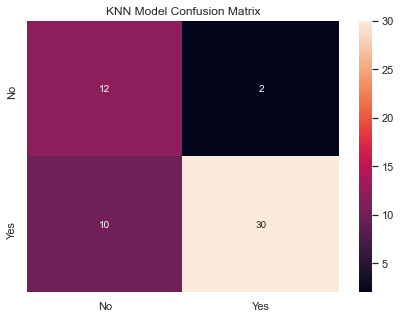

In [75]:
cm1=confusion_matrix(y2_test, knn_pred,labels=[0, 1])

df_cm1 = pd.DataFrame(cm1, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm1, annot=True ,fmt='g')
plt.title("KNN Model Confusion Matrix");

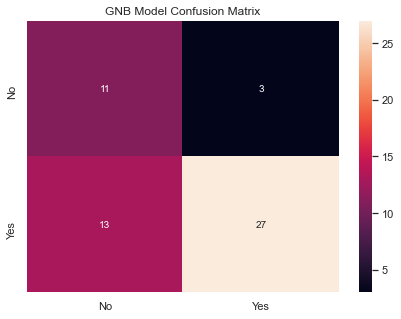

In [76]:
cm2=confusion_matrix(y2_test, gnb_pred,labels=[0, 1])

df_cm2 = pd.DataFrame(cm2, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm2, annot=True ,fmt='g')
plt.title("GNB Model Confusion Matrix");

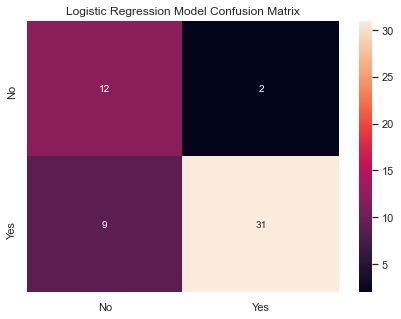

In [77]:
cm3=confusion_matrix(y2_test, lr_pred,labels=[0, 1])

df_cm3 = pd.DataFrame(cm3, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm3, annot=True ,fmt='g')
plt.title("Logistic Regression Model Confusion Matrix");

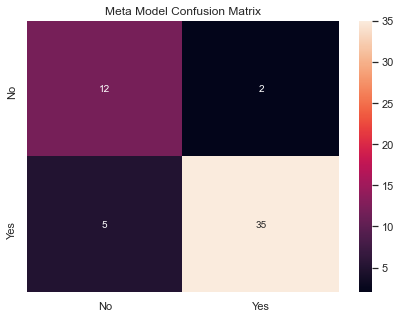

In [78]:
cm4=confusion_matrix(y2_test, stack_pred_1,labels=[0, 1])

df_cm4 = pd.DataFrame(cm4, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm4, annot=True ,fmt='g')
plt.title("Meta Model Confusion Matrix");

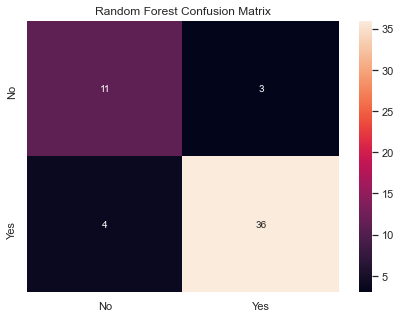

In [79]:
cm5=confusion_matrix(y2_test, y_predict2,labels=[0, 1])

df_cm5 = pd.DataFrame(cm5, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm5, annot=True ,fmt='g')
plt.title("Random Forest Confusion Matrix");

## 10.2. Compare models by accuracy score in test set

In [80]:
print("Training set score of KNN Model: {:.2f}".format(clf_1.score(X2_train, y2_train)))
print("Validation set score of KNN Model: {:.2f}".format(clf_1.score(X2_test, y2_test)))

print("Training set score GNB Model: {:.2f}".format(clf_2.score(X2_train, y2_train)))
print("Validation set score GNB Model: {:.2f}".format(clf_2.score(X2_test, y2_test)))

print("Training set score LR Model: {:.2f}".format(clf_3.score(X2_train, y2_train)))
print("Validation set score LR Model: {:.2f}".format(clf_3.score(X2_test, y2_test)))

print("Training set score Meta Model: {:.2f}".format(stack_clf.score(X2_train, y2_train)))
print("Validation set score Meta Model: {:.2f}".format(stack_clf.score(X2_test, y2_test)))

print("Training set score RF Model: {:.2f}".format(best_rf.score(X2_train, y2_train)))
print("Validation set score RF Model: {:.2f}".format(best_rf.score(X2_test, y2_test)))

Training set score of KNN Model: 0.91
Validation set score of KNN Model: 0.78
Training set score GNB Model: 0.84
Validation set score GNB Model: 0.70
Training set score LR Model: 0.88
Validation set score LR Model: 0.80
Training set score Meta Model: 0.96
Validation set score Meta Model: 0.87
Training set score RF Model: 1.00
Validation set score RF Model: 0.87


## 10.3. Identifying the best model by accuracy matrix

In [81]:
print(blue("KNN Model Accuracy Matrix:"))
# precision:
precision = precision_score(knn_pred, y2_test) #find the precision score for the test data
print('Precision: %f' % precision)

# recall:
recall = recall_score(y2_test, knn_pred) #find the recall score for the test data 
print('Recall: %f' % recall)

# f1: 
f1 = f1_score(y2_test, knn_pred) #find the f1 score for the test data 
print('F1 score: %f' % f1)

# ROC AUC Score
auc = roc_auc_score(y2_test, knn_pred) #find the roc auc score for the test data 
print('ROC AUC: %f' % auc)

KNN Model Accuracy Matrix:
Precision: 0.750000
Recall: 0.750000
F1 score: 0.833333
ROC AUC: 0.803571


In [82]:
print(blue("GNB Model Accuracy Matrix:"))
# precision:
precision = precision_score(gnb_pred, y2_test) #find the precision score for the test data
print('Precision: %f' % precision)

# recall:
recall = recall_score(y2_test, gnb_pred) #find the recall score for the test data 
print('Recall: %f' % recall)

# f1: 
f1 = f1_score(y2_test, gnb_pred) #find the f1 score for the test data 
print('F1 score: %f' % f1)

# ROC AUC Score
auc = roc_auc_score(y2_test, gnb_pred) #find the roc auc score for the test data 
print('ROC AUC: %f' % auc)

GNB Model Accuracy Matrix:
Precision: 0.675000
Recall: 0.675000
F1 score: 0.771429
ROC AUC: 0.730357


In [83]:
print(blue("LR Model Accuracy Matrix:"))
# precision:
precision = precision_score(lr_pred, y2_test) #find the precision score for the test data
print('Precision: %f' % precision)

# recall:
recall = recall_score(y2_test, lr_pred) #find the recall score for the test data 
print('Recall: %f' % recall)

# f1: 
f1 = f1_score(y2_test, lr_pred) #find the f1 score for the test data 
print('F1 score: %f' % f1)

# ROC AUC Score
auc = roc_auc_score(y2_test, lr_pred) #find the roc auc score for the test data 
print('ROC AUC: %f' % auc)

LR Model Accuracy Matrix:
Precision: 0.775000
Recall: 0.775000
F1 score: 0.849315
ROC AUC: 0.816071


In [84]:
print(blue("Meta Model Accuracy Matrix:"))
# precision:
precision = precision_score(stack_pred_1, y2_test) #find the precision score for the test data
print('Precision: %f' % precision)

# recall:
recall = recall_score(y2_test, stack_pred_1) #find the recall score for the test data 
print('Recall: %f' % recall)

# f1: 
f1 = f1_score(y2_test, stack_pred_1) #find the f1 score for the test data 
print('F1 score: %f' % f1)

# ROC AUC Score
auc = roc_auc_score(y2_test, stack_pred_1) #find the roc auc score for the test data 
print('ROC AUC: %f' % auc)

Meta Model Accuracy Matrix:
Precision: 0.875000
Recall: 0.875000
F1 score: 0.909091
ROC AUC: 0.866071


In [85]:
print(blue("RF Model Accuracy Matrix:"))
# precision:
precision = precision_score(y_predict2, y2_test) #find the precision score for the test data
print('Precision: %f' % precision)

# recall:
recall = recall_score(y2_test, y_predict2) #find the recall score for the test data 
print('Recall: %f' % recall)

# f1: 
f1 = f1_score(y2_test, y_predict2) #find the f1 score for the test data 
print('F1 score: %f' % f1)

# ROC AUC Score
auc = roc_auc_score(y2_test, y_predict2) #find the roc auc score for the test data 
print('ROC AUC: %f' % auc)

RF Model Accuracy Matrix:
Precision: 0.900000
Recall: 0.900000
F1 score: 0.911392
ROC AUC: 0.842857


**Interpretation:**

* Overall both the Stacked Classifier (Meta Classifier) and the Random Forest performed much better than the individual classifier models. 
* Interestingly the individual classifiers performed worse after outlier removal. This is probably due to the class imbalance, and presence of a number of PD patients (proportionally higher) in the outliers. The outlier removal was carried out before correcting the class imbalance. Therefore, in different random states, in the presence of class imbalance the trainings can be very different. The result could have been very different in a different random state. However, the meta model and random forest classifiers' accuracies improved after outlier removal and feature selection, because of the use of cross validation and random states. 
* The Random Forest Model performed slightly better compared to the meta model; however, hyperparameter tuning was computationally costlier than stacking here.
* In the given business case of detecting Parkinson's disease, both true positive and true negative are important. This is because if a healthy patient is misclassified as a case of PD, drugs with side effects would be prescribed, which can be very harmful to the patient. Similarly, if a PD patient is misclassified as healthy, the patient's treatment may get delayed/ in the extremes of instances the patient may not even receive the treatment.
* Recall in disease diagnosis is medically termed as diagnostic sensitivity, which reflects how many of the actual diseased patients are correctly detected by the test. Precision in disease diagnosis is medically termed as positive predictive value. This reflects that of the total positives detected by the test, how many are actually positive. Among the models, Random Forest Classifier were slightly better than the Meta classifier. 
* Area under the curve is almost similar for both the models (slightly higher in current run for meta classifier). This indicates that the RF Classifier and meta classifier are almost similar in terms of distinguishing between healthy and diseased patients.
* **I would therefore prefer the Random Forest classifier in this instance in real world setting.**